<a href="https://colab.research.google.com/github/avivajpeyi/Bayesian_Lectures/blob/master/SimpleHyperPE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Hyper-PE Example using $\vec{y}=\text{c}0+\text{c}1 \vec{x}$

This notebook presents an example of a parameter estimation followed by hyper parameter estimation using a line model. The equations for this notebook can be found [here](https://arxiv.org/pdf/1809.02293.pdf).

##### Setup

In [0]:
%%capture
! rm -rf outdir;
! pip install bilby;

import plotly.graph_objs as go
from plotly.offline import iplot, plot
from plotly import tools as plotly_tools


    

OUT_DIR = "outdir"

#####  Plotting utils

In [0]:
def enable_plotly_in_cell():
    import IPython
    from plotly.offline import init_notebook_mode

    display(
        IPython.core.display.HTML(
            ''' <script src="/static/components/requirejs/require.js"></script>'''
        )
    )
    init_notebook_mode(connected=False)
    



In [0]:
def plot_data(data_list):
    enable_plotly_in_cell()
    traces = []
    for idx, d in enumerate(data_list):
        trace = go.Scatter(
            x=d.x,
            y=d.data_vals,
            name=d.label,
            line=dict(width=3),
        )
        traces.append(trace)

    layout = dict(
        title='Visulising the data',
        xaxis=dict(title='x'),
        yaxis=dict(title='y(x)'),
        annotations=[
            dict(
                x=X_MIN,
                y=C0_AVG,
                xref='x',
                yref='y',
                text='True C0 = {}'.format(C0_AVG),
                showarrow=True,
                arrowhead=7,
                ax=+50,
                ay=-40,
            )
        ],
    )
    fig = dict(data=traces, layout=layout)
    iplot(fig, filename='raw_data.html')

In [0]:
def plot_sampling_results(results_dict):
    enable_plotly_in_cell()
    max_y = 0
    traces = []
    for label, results in results_dict.items():
        x = results.posterior[['c0']].values.flatten()
        trace = go.Histogram(
            x=x,
            opacity=0.50,
            name=label,
            histnorm='probability'
        )
        traces.append(trace)

    layout = dict(
        title='c0 samples',
        xaxis=dict(title='c0'),
        yaxis=dict(title='density'),
        barmode='overlay',
        annotations=[
            dict(
                x=C0_AVG,
                y=0,
                xref='x',
                yref='y',
                text='True C0 = {}'.format(C0_AVG),
                showarrow=True,
                arrowhead=7,
                ax=0,
                ay=-50,
                font = dict(
                  color = "white",
                ),
                arrowcolor = "white",
            )
        ],
    )
    fig = dict(data=traces, layout=layout)
    iplot(fig, filename='c0_histogram.html')

## Generate Line Datasets: $D=\{\vec{d_0}...,\vec{d_N} \}$

### Parameters for data generation

In [0]:
NUM_DATASETS = 10                # size of D
NUM_DATAPOINTS_PER_DATASET = 10  # size of di
FRACTION_WITH_SIGNAL = 0.8       # % of D contains signal

NOISE_MU = 0
NOISE_SIGMA = 1

C0_MIN = 5
C0_MAX = 5
C1_MIN = 0.0
C1_MAX = -2.5
C1_AVG = 1

X_MIN = 0
X_MAX = 10

In [0]:
import numpy as np
C0_AVG = np.mean([C0_MIN, C0_MAX])
C1_AVG = np.mean([C1_MIN, C1_MAX])
assert 0 <= FRACTION_WITH_SIGNAL <= 1, "Fraction with signal must be between 0 and 1"

### Line and Nosie model definitions

In [0]:
import numpy as np
import matplotlib.pyplot as plt
from typing import TypeVar
ndfloats = TypeVar('ndfloats', float, list, np.ndarray)  


def line_model(c0:float, c1:float, x:ndfloats)->ndfloats:
    return c0 + c1 * x


def noise_model(number_datapoints:int)->np.ndarray:
    return np.random.normal(loc=NOISE_MU, scale=NOISE_SIGMA, size=number_datapoints)

### Data generation and storage

In [0]:
from typing import List

class DataContainer(object):
    def __init__(
        self, 
        c0: float, 
        c1: float, 
        x: np.ndarray, 
        id: int, 
        inject_signal: bool
    ):
        self.c0 = c0
        self.c1 = c1
        self.x = x
        self.N = NUM_DATAPOINTS_PER_DATASET
        self.label = "{}_{}".format("signal" if inject_signal else "noise", id)
        self.y = None
        self.n = noise_model(self.N)
        self.inject_signal = inject_signal
        if inject_signal:
            self.y = line_model(c0, c1, x)
            self.data_vals = self.y + self.n
        else:
            self.data_vals = self.n


def generate_data_list(
    number_datasets: int,
    number_datapoints_per_dataset: int,
    fraction_with_signals: float,
)->List[DataContainer]:
    x = np.linspace(X_MIN, X_MAX, number_datapoints_per_dataset)

    inject_signal = [
        True if val < fraction_with_signals else False
        for val in np.random.uniform(0, 1, number_datapoints_per_dataset)
    ]

    data_list = [
        DataContainer(
            c0=np.random.uniform(C0_MIN, C0_MAX),
            c1=np.random.uniform(C1_MIN, C1_MAX),
            x=x,
            id=id,
            inject_signal=inject_signal[id],
        )
        for id in range(number_datasets)
    ]

    return data_list


### Generate and plot data

In [9]:
data_list = generate_data_list(
    number_datasets=NUM_DATASETS,
    number_datapoints_per_dataset=NUM_DATAPOINTS_PER_DATASET,
    fraction_with_signals=FRACTION_WITH_SIGNAL)

plot_data(data_list)

## Parameter Estimation

### Defining $L(\vec{d_i}|\text{c}0)$

In [0]:
from scipy.stats import norm
import bilby


class LineModelLikelihood(bilby.Likelihood):
    def __init__(self, data:DataContainer):
        self.data = data
        self.parameters = {'c0': None,}

    def log_likelihood(self):
        c0 = self.parameters['c0']
        sig = line_model(c0, self.data.c1, self.data.x)
        res = self.data.data_vals - sig
        lnL_d_i = norm.logpdf(res, loc=NOISE_MU, scale=NOISE_SIGMA)
        lnL = np.sum(lnL_d_i)
        return lnL

    def noise_log_likelihood(self):
        lnL_d_i = norm.logpdf(self.data.data_vals, loc=NOISE_MU, scale=NOISE_SIGMA)
        lnL = np.sum(lnL_d_i)
        return lnL


In [0]:
def sample_c0_for_data(data_list:list, outdir:str)->dict:
    c0_prior = bilby.core.prior.PriorDict(dict(c0=bilby.core.prior.Uniform(0.1, 10, 'c0')))
    results = {data.label: None for data in data_list}
    for idx, data in enumerate(data_list):
        likelihood = LineModelLikelihood(data)
        result = bilby.run_sampler(
            likelihood=likelihood,
            priors=c0_prior,
            sampler='dynesty',
            npoints=500,
            walks=10,
            outdir=outdir,
            label=data.label,
        )
        results.update({data.label: result})
    return results


### Sample $P(\text{c}0| \vec{d_i})\ \forall\  \vec{d_i}\in D$

In [0]:
pe_results_dict = sample_c0_for_data(data_list, OUT_DIR)

In [13]:
plot_sampling_results(pe_results_dict)

### Summarise PE Results

In [0]:
import pandas as pd   

LOG_EVIDENCE = 'log_evidence'
LOG_BAYES_FACTOR = 'log_bayes_factor'
LOG_NOISE_EVIDENCE = 'log_noise_evidence'


class ResultSummary(object):
    def __init__(self, result, label):
        pe_result = result
        self.log_bayes_factor = result.log_bayes_factor
        self.log_evidence = result.log_evidence
        self.log_noise_evidence = result.log_noise_evidence
        self.label = label

    def to_dict(self):
        result_summary_dict = { 
            LOG_BAYES_FACTOR: self.log_bayes_factor,
            LOG_EVIDENCE: self.log_evidence,
            LOG_NOISE_EVIDENCE: self.log_noise_evidence
        }
        return result_summary_dict
 
def results_summary(results_dict, ):

  labels = []
  log_bayes_factors = []
  log_evidences = []
  log_noise_evidences = []
  posterior = []
  has_signal = []
          
  for label, result in results_dict.items():
    labels.append(label)
    log_bayes_factors.append(result.log_bayes_factor)
    log_evidences.append(result.log_evidence)
    log_noise_evidences.append(result.log_noise_evidence)
    posterior.append(result.posterior)
    has_signal.append(True if "signal" in label else False)
    
  return pd.DataFrame(dict(
    labels = labels,
    has_signal=has_signal,
    log_bayes_factor = log_bayes_factors,
    log_evidence = log_evidences,
    log_noise_evidence = log_noise_evidences,
    posterior = posterior
  ))

In [38]:
results_summary_dataframe = results_summary(pe_results_dict)
results_summary_dataframe.drop(columns=['posterior'])

,labels,has_signal,log_bayes_factor,log_evidence,log_noise_evidence
0,signal_0,True,59.571143,-17.627200,-77.198343
1,signal_1,True,52.405124,-13.100933,-65.506057
2,signal_2,True,25.832589,-15.980366,-41.812955
3,noise_3,False,-28.659001,-43.341570,-14.682569
4,signal_4,True,88.850827,-16.743404,-105.594231
5,signal_5,True,193.740623,-18.343445,-212.084068
6,signal_6,True,96.524606,-18.128070,-114.652676
7,signal_7,True,91.934182,-15.985602,-107.919784
8,signal_8,True,171.435491,-16.489090,-187.924581
9,noise_9,False,-4.259232,-20.673247,-16.414016


In [40]:
only_signal_results_dataframe = results_summary_dataframe[results_summary_dataframe['has_signal'] == True]
only_signal_results_dataframe.drop(columns=['posterior', 'has_signal'])

,labels,log_bayes_factor,log_evidence,log_noise_evidence
0,signal_0,59.571143,-17.627200,-77.198343
1,signal_1,52.405124,-13.100933,-65.506057
2,signal_2,25.832589,-15.980366,-41.812955
4,signal_4,88.850827,-16.743404,-105.594231
5,signal_5,193.740623,-18.343445,-212.084068
6,signal_6,96.524606,-18.128070,-114.652676
7,signal_7,91.934182,-15.985602,-107.919784
8,signal_8,171.435491,-16.489090,-187.924581


## Hyper-parameter Estimation

### Duty cycle hyper parameter estimation

#### The math


\begin{align*}
&\log L(\vec{d}|\Lambda) &&= \sum_i \log L(d_i|\Lambda)\\
& &&= \sum_i \log (Z^i_s\xi - Z^i_n(1-\xi))\\
& &&=  \sum_i \log (\text{e}^{\log(Z^i_s\xi)} + \text{e}^{\log{Z^i_n(1-\xi)}})\\
& &&=  \sum_i \log (\text{e}^{\log(Z^i_s\xi)} + \text{e}^{\log{Z^i_n(1-\xi)}})\\
& &&= \sum_i \log (\text{e}^{\log Z^i_s + \log \xi} + \text{e}^{\log{Z^i_n}+\log{(1-\xi)}})\\
& &&= \sum_i \text{LSE}(\log Z^i,  + \log \xi,\ \log{Z^i_n}+\log{(1-\xi)})
\end{align*}

Where LSE is scipy's `logsumexp` function.


#### The code

In [0]:
from scipy.special import logsumexp

DUTY_CYCLE = 'xi'

class DutyLikelihood(bilby.Likelihood):
    def __init__(self, evidence_dataframe: pd.DataFrame):
        """
        L(data|xi, signal *or* noise) = L(data|signal)*xi +(1-xi)*L(data|noise)
        where xi --> p(signal)

        Parameters
        ----------
        evidence_dataframe: pandas dataframe
        """
        bilby.Likelihood.__init__(self, parameters={DUTY_CYCLE: None})
        nan_present = evidence_dataframe.isnull().values.any()
        assert not nan_present, "NaN present in the evidence dataframe!"
        self.log_evidence = evidence_dataframe[LOG_EVIDENCE].values
        self.log_noise_evidence = evidence_dataframe[LOG_NOISE_EVIDENCE].values

    def log_likelihood(self):
        """
        L = Z*xi + Zn*(1-xi)
        """
        log_xi = np.log(self.parameters[DUTY_CYCLE])
        log_1_minus_xi = np.log(1.0-self.parameters[DUTY_CYCLE])
        ln_likelihood_di = logsumexp(
            a=[self.log_evidence + log_xi,
               self.log_noise_evidence + log_1_minus_xi],
            axis=0
        )
        assert len(ln_likelihood_di) == len(self.log_evidence), "len(d) {}, len(LnL(di)) {}".format(len(self.log_evidence), len(ln_likelihood_di))
        ln_likelihood = np.sum(ln_likelihood_di)
        return ln_likelihood


In [0]:
def sample_duty_cycle_likelihood(results_dataframe: pd.DataFrame, outdir):
    likelihood_fn = DutyLikelihood(results_dataframe[[LOG_EVIDENCE, LOG_NOISE_EVIDENCE]])
    priors = {DUTY_CYCLE: bilby.core.prior.Uniform(0.001, 1, DUTY_CYCLE)}

    result = bilby.run_sampler(
        likelihood=likelihood_fn,
        priors=priors,
        sampler='dynesty',
        npoints=500,
        walks=10,
        outdir=outdir,
        label=DUTY_CYCLE,
    )
    return result

In [0]:
duty_cycle_result = sample_duty_cycle_likelihood(results_summary_dataframe, outdir=OUT_DIR)

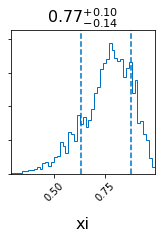

In [19]:
duty_cycle_result.plot_corner()

### c0 hyper parameter estimation

#### The math


\begin{align*}
&\log L(\vec{d}|\Lambda) &&= \sum_i \log  L(d_i|\Lambda)\\
& &&= \sum_i \log \bigg(\frac{Z_i}{n_i}\sum_k^{n_i}\frac{\pi(\theta_i^k|\Lambda)}{\pi(\theta_i^k)}\bigg) \\
& &&= \sum_i \bigg(\log Z_i-\log n_i + \log\sum_k^{n_i}\frac{\pi(\theta_i^k|\Lambda)}{\pi(\theta_i^k)}\bigg) \\
& &&= \sum_i \bigg(\log Z_i-\log n_i + \log\sum_k^{n_i}\exp \log\frac{\pi(\theta_i^k|\Lambda)}{\pi(\theta_i^k)}\bigg) \\
& &&= \sum_i \bigg(\log Z_i-\log n_i + \log\sum_k^{n_i}\exp (\log \pi(\theta_i^k|\Lambda) -\log \pi(\theta_i^k) )\bigg) \\
& &&= \sum_i \bigg(\log Z_i -\log n_i + \ \text{LSE}_k (\log \pi(\theta_i^k|\Lambda) -\log \pi(\theta_i^k) ) \bigg)
\end{align*}

Where LSE is scipy's `logsumexp` function.


### The code

In [0]:
from scipy.stats import norm
from scipy.special import logsumexp

from pprint import pprint

C0_MU = 'c0_mu'
C0_SIGMA = 'c0_sigma'
c0_label = 'c0'


class C0Likelihood(bilby.Likelihood):
    def __init__(self, df):
        bilby.Likelihood.__init__(
            self, parameters={C0_MU: None, C0_SIGMA: None}
        )
        self.number_datasets = len(df)
        self.log_number_samples = self.get_log_number_samples(df)
        self.log_evidence = self.get_log_evidences(df)
        self.log_prior = self.get_log_prior(df)
        self.c0_samples = self.get_c0_samples(df)
        self.log_hyperprior = None
        l = [
            self.log_number_samples,
            self.log_evidence,
            self.log_prior,
            self.c0_samples,
        ]
        assert len(set(len(x) for x in l)) == 1, [len(x) for x in l]

    @staticmethod
    def get_log_number_samples(df):
        number_samples = [
            len(d.posterior)
            for (index, d) in df.iterrows()
        ]
        return np.log(number_samples)

    @staticmethod
    def get_log_evidences(df):
        return df.log_evidence.values

    @staticmethod
    def get_log_prior(df):
        log_priors = [
            d.posterior.log_prior.values
            for (index, d) in df.iterrows()
        ]
        return log_priors

    @staticmethod
    def get_c0_samples(df):
        c0_samples = [
            d.posterior.c0.values
            for (index, d) in df.iterrows()
        ]
        return c0_samples

    def get_log_hyperprior(self, mu, sigma):
        log_hyperprior = [
            norm.logpdf(c0_sample, mu, sigma)
            for c0_sample in self.c0_samples
        ]
        return log_hyperprior


    def log_likelihood_di(self, i):
      ratio = logsumexp(self.log_hyperprior[i] - self.log_prior[i])
      return self.log_evidence[i] -self.log_number_samples[i] + ratio
    
    def log_likelihood(self):
        self.log_hyperprior = self.get_log_hyperprior(mu=self.parameters[C0_MU], sigma=self.parameters[C0_SIGMA])

        ln_likelihood_di = [
            self.log_likelihood_di(idx)
            for idx in range(self.number_datasets)            
        ]

        ln_likelihood = np.sum(ln_likelihood_di)
        return ln_likelihood


In [0]:
def sample_c0_likelihood(df: pd.DataFrame, outdir):
    likelihood_fn = C0Likelihood(df)
    priors = {
        C0_MU: bilby.core.prior.Uniform(C0_AVG - 1, C0_AVG + 1, C0_MU),
        C0_SIGMA: bilby.core.prior.Uniform(0.2, 2, C0_SIGMA),
    }

    result = bilby.run_sampler(
        likelihood=likelihood_fn,
        priors=priors,
        sampler='dynesty',
        npoints=500,
        walks=10,
        outdir=outdir,
        label=c0_label,
    )

    return result

In [0]:
c0_hyperpe_result = sample_c0_likelihood(only_signal_results_dataframe, outdir=OUT_DIR)

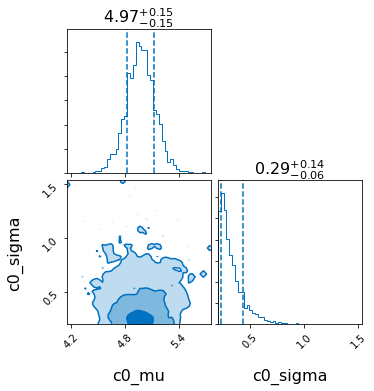

In [31]:
c0_hyperpe_result.plot_corner()